<div align='center'>

# Unsupervised Learning - Part 1

### Part of Scientific-ML-Notes 

[![GitHub](https://img.shields.io/badge/GitHub-Repository-black?logo=github&scale=5)](https://github.com/mhnaderi/Scientific-ML-Notes)

---

In [1]:
#! Always run this cell first to import all necessary libraries and to set up the notebook environment

! pip install -q flax
! pip install -q optax
! pip install -q equinox
! pip install -q diffrax
! pip install -q jaxtyping
! pip install -q tensorflow_datasets
! pip install -q tensorflow_probability

import numpy as np
from tqdm import trange
from typing import Sequence
from functools import partial

import jax 
import jax.numpy as jnp
from flax import linen as nn  # Neural network library on top of JAX
from jax.tree_util import tree_map  # Utilities for PyTree structures
from jaxtyping import PyTree  # Type annotations for JAX
from jax import random, jit, vmap, grad, value_and_grad, config  # Common JAX functions
config.update("jax_enable_x64", True)  # Enable 64-bit precision

import optax  # Optimization algorithms for JAX
import diffrax as dfx  # Differential equation solvers
import equinox as eqx  # PyTorch-like neural network library for JAX
from sklearn import datasets, preprocessing  # Data handling and preprocessing utilities
import tensorflow_datasets as tfds  # Access to TensorFlow Datasets
from tensorflow_probability.substrates import jax as tfp  # Probabilistic programming in JAX

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.rcParams.update({"font.family": "serif"})
plt.rcParams.update({"figure.facecolor": 'white', "axes.facecolor": 'white'})

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-macos 2.13.0 requires numpy<=1.24.3,>=1.22, but you have numpy 1.26.0 which is incompatible.
tensorflow-macos 2.13.0 requires typing-extensions<4.6.0,>=3.6.6, but you have typing-extensions 4.12.2 which is incompatible.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.3 which is incompatible.


# Unsupervised Learning

Unsupervised learning models are trained on a set of observed data without any associated labels. Unsupervised learning encompasses various models that can be categorized based on their characteristics:

- **Generative Models**: These models can synthesize new data samples that have similar statistical properties to the training data. They aim to model the underlying data distribution and generate new examples by sampling from this distribution.

- **Probabilistic Models**: A subset of generative models that define a probability distribution over the data, allowing for likelihood computation, which is useful for tasks like density estimation and anomaly detection.

- **Latent Variable Models**: These models introduce hidden variables (latent variables) that capture underlying structures or patterns in the data. The latent variables often have lower dimensionality than the observed data, effectively serving as a compressed representation. The mapping between the latent variables and observed data can occur in either direction.

A **generative model** defines a joint probability distribution $p(\boldsymbol{x})$ over data examples $\boldsymbol{x} \in \mathcal{X}$. Sometimes, the model is conditioned on additional inputs or covariates $\boldsymbol{c} \in \mathcal{C}$, resulting in a conditional generative model $p(\boldsymbol{x} \mid \boldsymbol{c})$.

In unsupervised learning, it is common to establish a relationship between the observed data $\boldsymbol{x}$ and latent variables $\boldsymbol{z}$. These latent variables capture the underlying structure of the dataset and typically have lower dimensionality than $\boldsymbol{x}$, serving as a compressed representation. The mapping between $\boldsymbol{x}$ and $\boldsymbol{z}$ can be bidirectional:

- **Data to Latent Variables**: Some models map data $\boldsymbol{x}$ to latent variables $\boldsymbol{z}$. For example, the $k$-means algorithm assigns each data point $\boldsymbol{x}$ to a cluster (latent variable).

- **Latent Variables to Data**: Other models map latent variables $\boldsymbol{z}$ to data $\boldsymbol{x}$. By defining a distribution $\operatorname{Pr}(\boldsymbol{z})$ over the latent variables, we can generate new data samples by (i) sampling from this distribution and (ii) mapping the samples to the data space $\boldsymbol{x}$. Such models are referred to as generative models.

### Types of Deep Generative Models

Deep generative models (DGMs) can be categorized based on several criteria:

- **Density Evaluation**: Does the model allow for pointwise evaluation of the probability density function $p(\boldsymbol{x})$? Is this computation exact or approximate, fast or slow? For example, VAEs provide a lower bound on the density, normalizing flows allow exact density computation, and GANs do not define an explicit density function.

- **Sampling Efficiency**: Can the model generate new samples $\boldsymbol{x} \sim p(\boldsymbol{x})$ efficiently? Some models, like GANs and VAEs, support fast sampling, while others, like diffusion models and EBMs, involve iterative procedures that are slower.

- **Training Methodology**: What techniques are used for parameter estimation? Some models use maximum likelihood estimation (MLE), while others rely on approximations or alternative objectives, such as the min-max game in GANs.

- **Latent Variables**: Does the model incorporate latent variables $\boldsymbol{z}$? If so, are these variables of the same dimensionality as $\boldsymbol{x}$, or do they provide a compressed representation?

- **Architectural Constraints**: Are there any restrictions on the neural network architecture used in the model? For instance, normalizing flows require invertible neural networks with tractable Jacobians.

#### Summary of Deep Generative Models

<div align="center">

| Model          | Density                | Sampling        | Training       | Latents         | Architecture             |
|----------------|------------------------|-----------------|----------------|-----------------|--------------------------|
| **VAE**        | Lower bound, fast      | Fast            | MLE-LB         | $\mathbb{R}^r$  | Encoder-Decoder          |
| **ARM**        | Exact, fast            | Slow            | MLE            | None            | Sequential               |
| **Flows**      | Exact, fast            | Fast            | MLE            | $\mathbb{R}^N$  | Invertible               |
| **Diffusion**  | Lower bound            | Slow            | MLE-LB         | $\mathbb{R}^N$  | Encoder-Decoder          |
| **EBM**        | Approximate, slow      | Slow            | Approx. MLE    | Optional        | Flexible                 |
| **GAN**        | Not applicable (NA)    | Fast            | Min-max        | $\mathbb{R}^r$  | Generator-Discriminator  |
| **PGM-D**      | Exact, fast            | Fast            | MLE            | Optional        | Sparse DAG               |
| **PGM-U**      | Approximate, slow      | Slow            | Approx. MLE    | Optional        | Sparse Graph             |

</div>

**Notes**:

- **Density**: Indicates if the model can compute $p(\boldsymbol{x})$ and whether it's exact or approximate.

- **Sampling**: Describes the efficiency of generating new samples.

- **Training**: Specifies the training method, such as Maximum Likelihood Estimation (MLE) or min-max optimization.

- **Latents**: Details the use of latent variables and their dimensionality.

- **Architecture**: Highlights any architectural requirements.

### Learning Objectives in Generative Modeling

Generative models have different learning objectives based on their design:

- **Generative Adversarial Networks (GANs)**: Learn to generate data samples $\boldsymbol{x}^*$ from latent variables $\boldsymbol{z}$ by optimizing a loss function that minimizes the distinguishability between generated and real data.

- **Probabilistic Generative Models**: Models like VAEs, Normalizing Flows, and Diffusion Models assign a probability $\operatorname{Pr}(\boldsymbol{x} \mid \boldsymbol{\phi})$ to each data point $\boldsymbol{x}$, where $\boldsymbol{\phi}$ are the model parameters. They aim to maximize the likelihood of the observed data:

  $$
  L[\boldsymbol{\phi}] = -\sum_{i=1}^I \log \operatorname{Pr}(\boldsymbol{x}_i \mid \boldsymbol{\phi}).
  $$

  This maximization increases the probability assigned to training data while inherently reducing the probability of data points that differ significantly from the training distribution. Assigning probabilities enables model comparison and outlier detection.

## The Curse of Dimensionality in Unsupervised Learning

Consider modeling each pixel in a $28 \times 28$ image—totaling 784 pixels—as a binary random variable that can be either black (0) or white (1). This setup means the entire image can be in one of $2^{784}$ possible states, an astronomically large number. Such an immense state space poses significant challenges when attempting to sample from the joint distribution $p(x_1, x_2, \ldots, x_n)$ to generate an image, due to the sheer complexity involved.

Specifying this joint distribution requires $2^n - 1$ parameters (since the probabilities must sum to one), highlighting the impracticality of managing such high-dimensional data directly. This exponential growth in complexity with increasing dimensions is a classic example of the **Curse of Dimensionality**.

### First Approach: Independence Assumption

One way to alleviate the curse of dimensionality is by assuming that the pixels $X_1, X_2, \ldots, X_n$ are independent of each other, leading to the factorization:

$$
p(x_1, x_2, \ldots, x_n) = p(x_1) p(x_2) \ldots p(x_n)
$$

With this assumption, the number of parameters required to specify the joint distribution drastically reduces from $2^n - 1$ to just $n$ (one for each marginal distribution). However, this simplification often proves unrealistic for image data, as it ignores the dependencies between pixels—particularly the correlations between neighboring pixels—which are crucial for capturing the true structure of images.

### Second Approach: Autoregressive Models (ARMs)

Another strategy is to use the chain rule of probability to factorize the joint distribution:

$$
p(x_1, x_2, \ldots, x_n) = p(x_1) \, p(x_2 \mid x_1) \, p(x_3 \mid x_1, x_2) \ldots p(x_n \mid x_1, x_2, \ldots, x_{n-1})
$$

This formulation is known as an **Autoregressive Model (ARM)**. However, the number of parameters remains $2^n - 1$, similar to modeling the full joint distribution, because each conditional probability $p(x_i \mid x_1, x_2, \ldots, x_{i-1})$ requires $2^{i-1}$ parameters.

To reduce the parameter count, we can introduce the **Markov assumption**, where each variable depends only on its immediate predecessor:

$$
p(x_1, x_2, \ldots, x_n) = p(x_1) \, p(x_2 \mid x_1) \, p(x_3 \mid x_2) \ldots p(x_n \mid x_{n-1})
$$

This first-order autoregressive model significantly reduces the number of parameters to $2n - 1$. Despite this reduction, the Markov assumption may be too limiting, as it only captures dependencies between adjacent variables.

To address this limitation, we can introduce a hidden state $z_t$ that summarizes past observations, allowing $x_n$ to depend on all previous variables without explicitly conditioning on them. If $z_t$ is a deterministic function of past inputs, we obtain a **Recurrent Neural Network (RNN)**. If $z_t$ is stochastic and depends on the previous hidden state $z_{t-1}$, we have a **Hidden Markov Model (HMM)**.

Alternatively, we can maintain the general autoregressive form but use neural networks to parameterize the conditionals $p(x_t \mid x_{1:t-1})$. This approach allows us to implicitly learn the mapping from past to future without making strict independence assumptions, capturing more complex dependencies in the data.

### Third Approach: Directed Graphical Models (Bayesian Networks)

To generalize conditional independence assumptions further, we can employ **Bayesian Networks**, which represent the joint distribution using a directed acyclic graph (DAG). In this framework, each variable $x_i$ is conditionally dependent on a subset of variables known as its parents, denoted as $x_{\mathrm{Pa}(i)}$. The joint distribution factorizes as:

$$
p(x_1, x_2, \ldots, x_n) = \prod_{i=1}^n p\left(x_i \mid x_{\mathrm{Pa}(i)}\right)
$$

A Bayesian Network is specified by:

- **Nodes ($V$)**: Each node represents a random variable $X_i$.
- **Edges ($E$)**: Directed edges indicate dependencies between variables.
- **Conditional Probability Distributions**: For each node $i$, we define $p\left(x_i \mid x_{\mathrm{Pa}(i)}\right)$, specifying the probability of $x_i$ given its parents.

This structure allows us to model complex dependencies while potentially reducing the number of parameters compared to the full joint distribution.

**Example: Student Performance Network**

Consider a Bayesian Network modeling relationships among variables related to a student's academic performance:

- **D**: Difficulty of the course.
- **I**: Student's intelligence.
- **G**: Grade in the course.
- **S**: SAT score.
- **L**: Letter of recommendation.

The dependencies are defined as:

- **G** depends on **D** and **I**.
- **S** depends on **I**.
- **L** depends on **G**.

The joint distribution factorizes accordingly:

$$
p(D, I, G, S, L) = p(D) \cdot p(I) \cdot p(G \mid D, I) \cdot p(S \mid I) \cdot p(L \mid G)
$$

This factorization captures the conditional independencies among variables, allowing us to model the system efficiently without specifying the full joint distribution.

### Limitations of Autoregressive Models

While autoregressive models offer a way to capture dependencies between variables, they have some drawbacks:

- **Sequential Sampling**: Generating new samples requires sequentially sampling each variable conditioned on the previous ones, which can be computationally intensive for high-dimensional data like images.
- **Absence of Latent Variables**: Autoregressive models do not incorporate latent variables, limiting their ability to capture global structures or underlying patterns in the data that are not directly observable.

## Generative Adversarial Networks (GANs)

[Interactive Visualization of GANs](https://poloclub.github.io/ganlab/)

Generative Adversarial Networks (GANs) are a type of unsupervised model designed to generate new data samples that closely resemble a given set of training data. Instead of explicitly modeling the probability distribution of the data, GANs focus on generating realistic samples through a game-theoretic approach involving two neural networks: a generator and a discriminator.

- **Generator**: This network maps random noise vectors (latent variables) to the data space, producing synthetic samples.
- **Discriminator**: This network evaluates both real and generated samples, attempting to distinguish between them by assigning a probability of being real.

### The GAN Mechanism

The training process of GANs involves an adversarial game between the generator and the discriminator:

1. **Sample Generation**: The generator creates synthetic data samples by transforming random noise inputs.
2. **Discrimination**: The discriminator assesses both real samples (from the training data) and generated samples, outputting probabilities indicating their authenticity.
3. **Discriminator Training**: The discriminator is trained to maximize its ability to correctly identify real and fake samples. It adjusts its parameters to assign high probabilities to real samples and low probabilities to generated ones.
4. **Generator Training**: The generator is trained to minimize the discriminator's ability to detect that its outputs are fake. It updates its parameters to produce samples that the discriminator classifies as real.
5. **Alternating Updates**: The generator and discriminator are updated in turns, continually improving each other's performance. Over time, the generator learns to produce samples that are indistinguishable from real data, while the discriminator becomes more adept at spotting fakes.

This iterative process continues until the discriminator can no longer reliably distinguish between real and generated samples, indicating that the generator has learned the underlying data distribution well.

### GAN Loss Functions

The loss functions for the generator and discriminator are defined to reflect their opposing objectives:

- **Discriminator Loss ($L_D$)**:

  $$
  L_D = -\left( \mathbb{E}_{\mathbf{x} \sim p_{\text{data}}} [\log D(\mathbf{x})] + \mathbb{E}_{\mathbf{z} \sim p_{\mathbf{z}}} [\log (1 - D(G(\mathbf{z})))] \right)
  $$

  - $\mathbf{x}$: Real data sample from the data distribution $p_{\text{data}}$.
  - $\mathbf{z}$: Random noise vector from the latent space distribution $p_{\mathbf{z}}$.
  - $D(\cdot)$: Discriminator's probability estimate that the input is real.

  The discriminator aims to maximize $L_D$ by correctly classifying real and generated samples.

- **Generator Loss ($L_G$)**:

  $$
  L_G = -\mathbb{E}_{\mathbf{z} \sim p_{\mathbf{z}}} [\log D(G(\mathbf{z}))]
  $$

  The generator aims to minimize $L_G$ by producing samples that the discriminator classifies as real.

### Challenges with GANs

While GANs have demonstrated impressive capabilities, they come with several challenges that can hinder their practical use:

- **Unstable Training Dynamics**: Training involves finding a balance (Nash equilibrium) in a two-player game, which can be difficult. The simultaneous training of two networks can lead to instability, with one network overpowering the other, causing training to fail.

- **Vanishing Gradients**: If the discriminator becomes too proficient, it may assign very confident predictions, leading to minimal gradient signals for the generator. This situation hampers the generator's ability to improve, as it receives little information on how to adjust its outputs.

- **Mode Collapse**: The generator may fall into a pattern where it produces a limited variety of samples, effectively ignoring parts of the data distribution. This results in generated data lacking diversity, failing to capture the full complexity of the real data.

Due to these challenges, GANs can be difficult to train effectively and often require careful tuning and experimentation. In recent years, alternative generative models, such as diffusion models, have gained prominence for their stability and ease of training in applications like image generation.


*Note: GANs were once widely used for generative tasks, but their practical application has decreased due to training difficulties. Modern approaches often favor models like diffusion models, which offer more stable training dynamics.*

# Normalizing Flows

Normalizing flows are a class of generative models that transform a simple probability distribution into a more complex one using a sequence of invertible mappings, often parameterized by neural networks. By starting with a tractable base distribution (such as a standard normal distribution) and applying these transformations, we can model complex data distributions while being able to compute exact likelihoods and generate new samples.

An essential requirement for normalizing flows is that each transformation (or layer) must be invertible and have a tractable Jacobian determinant. This ensures efficient computation of both the likelihoods and the sampling process.

## Change of Variables Formula

Consider a random variable $z$ with density $p_z(z)$. If we apply an invertible transformation $x = f(z)$, the density of $x$ is given by the change of variables formula:

$$
p_x(x) = p_z(z) \left| \frac{dz}{dx} \right| = p_z(f^{-1}(x)) \left| \frac{df^{-1}(x)}{dx} \right|
$$

In the multivariate case, where $\mathbf{z} \in \mathbb{R}^D$ and $\mathbf{x} = \mathbf{f}(\mathbf{z})$, the formula generalizes to:

$$
p_{\mathbf{x}}(\mathbf{x}) = p_{\mathbf{z}}(\mathbf{z}) \left| \det \left( \frac{\partial \mathbf{f}(\mathbf{z})}{\partial \mathbf{z}} \right) \right|^{-1}
$$

Here, $\frac{\partial \mathbf{f}(\mathbf{z})}{\partial \mathbf{z}}$ is the Jacobian matrix of the transformation $\mathbf{f}$ with respect to $\mathbf{z}$. Taking logarithms, we have:

$$
\log p_{\mathbf{x}}(\mathbf{x}) = \log p_{\mathbf{z}}(\mathbf{z}) - \log \left| \det \left( \frac{\partial \mathbf{f}(\mathbf{z})}{\partial \mathbf{z}} \right) \right|
$$

## Constructing Normalizing Flows

In normalizing flows, we define an invertible mapping $\mathbf{x} = \mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$, where $\boldsymbol{\phi}$ represents the parameters of the transformations. Starting from a base distribution $p(\mathbf{z})$, usually a standard normal distribution, we can generate samples in the data space $\mathbf{x}$ by:

1. **Sampling**: Draw a sample $\mathbf{z} \sim p(\mathbf{z})$.
2. **Transformation**: Compute $\mathbf{x} = \mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$.

To compute the likelihood of an observed data point $\mathbf{x}$, we:

1. **Inverse Transformation**: Compute $\mathbf{z} = \mathbf{f}^{-1}(\mathbf{x}; \boldsymbol{\phi})$.
2. **Apply Change of Variables**:

   $$
   p(\mathbf{x} \mid \boldsymbol{\phi}) = p(\mathbf{z}) \left| \det \left( \frac{\partial \mathbf{f}(\mathbf{z}; \boldsymbol{\phi})}{\partial \mathbf{z}} \right) \right|^{-1}
   $$

This process requires efficient computation of both the inverse transformation and the determinant of the Jacobian matrix.

### Composing Invertible Transformations

Normalizing flows are typically constructed by composing multiple invertible transformations. Let each transformation be denoted by $\mathbf{f}_k$, with parameters $\boldsymbol{\phi}_k$. The overall transformation is:

$$
\mathbf{x} = \mathbf{f}(\mathbf{z}; \boldsymbol{\phi}) = \mathbf{f}_K \circ \mathbf{f}_{K-1} \circ \cdots \circ \mathbf{f}_1(\mathbf{z})
$$

The inverse transformation is:

$$
\mathbf{z} = \mathbf{f}^{-1}(\mathbf{x}; \boldsymbol{\phi}) = \mathbf{f}_1^{-1} \circ \mathbf{f}_2^{-1} \circ \cdots \circ \mathbf{f}_K^{-1}(\mathbf{x})
$$

The determinant of the Jacobian of the overall transformation is the product of the determinants of each individual transformation:

$$
\det \left( \frac{\partial \mathbf{f}(\mathbf{z}; \boldsymbol{\phi})}{\partial \mathbf{z}} \right) = \prod_{k=1}^K \det \left( \frac{\partial \mathbf{f}_k(\mathbf{h}_{k-1}; \boldsymbol{\phi}_k)}{\partial \mathbf{h}_{k-1}} \right)
$$

where $\mathbf{h}_{k-1}$ is the output of the $(k-1)$-th layer, with $\mathbf{h}_0 = \mathbf{z}$.

### Training the Model

We train the parameters $\boldsymbol{\phi}$ by maximizing the likelihood of the training data $\{\mathbf{x}_i\}_{i=1}^N$. The log-likelihood for each data point is:

$$
\log p(\mathbf{x}_i \mid \boldsymbol{\phi}) = \log p(\mathbf{z}_i) - \log \left| \det \left( \frac{\partial \mathbf{f}(\mathbf{z}_i; \boldsymbol{\phi})}{\partial \mathbf{z}_i} \right) \right|
$$

where $\mathbf{z}_i = \mathbf{f}^{-1}(\mathbf{x}_i; \boldsymbol{\phi})$. The total loss to minimize (negative log-likelihood) is:

$$
L(\boldsymbol{\phi}) = -\sum_{i=1}^N \left[ \log p(\mathbf{z}_i) - \log \left| \det \left( \frac{\partial \mathbf{f}(\mathbf{z}_i; \boldsymbol{\phi})}{\partial \mathbf{z}_i} \right) \right| \right]
$$

This optimization requires efficient computation of both the inverse transformations and the Jacobian determinants.

### Understanding Forward and Inverse Mappings

In the context of normalizing flows:

- **Forward Mapping**: Transforms latent variables $\mathbf{z}$ from the base distribution into data space $\mathbf{x}$ using the sequence of transformations $\mathbf{f}$.
- **Inverse Mapping**: Transforms data points $\mathbf{x}$ back into latent variables $\mathbf{z}$ by applying the inverses of the transformations in reverse order.

This bidirectional capability allows us to compute exact likelihoods and generate new samples.

## Key Requirements for Normalizing Flows

To ensure normalizing flows are practical and effective, the transformations must satisfy the following properties:

1. **Expressivity**: The series of transformations should be powerful enough to model the complexity of the target data distribution by transforming the base distribution accordingly.
2. **Invertibility and Efficient Computation**: Each transformation must be invertible, and both the forward and inverse computations should be efficient to perform. This is crucial for both sampling and likelihood estimation.
3. **Tractable Jacobian Determinants**: It should be feasible to compute the determinant (or log-determinant) of the Jacobian matrix of each transformation efficiently. This is necessary for evaluating the likelihood during training.

Common types of invertible transformations used in normalizing flows include coupling layers, autoregressive layers, and invertible convolutions.

## Multiscale Architectures in Normalizing Flows

A challenge with normalizing flows is that the dimensionality of the latent space $\mathbf{z}$ must match that of the data space $\mathbf{x}$. However, real-world data often lies on a lower-dimensional manifold, and it is inefficient to process high-dimensional latent variables through every layer.

**Multiscale architectures** address this by progressively introducing latent variables at different scales:

- **Partitioning Latent Variables**: Split the latent vector into parts $\mathbf{z} = [\mathbf{z}_1, \mathbf{z}_2, \ldots, \mathbf{z}_N]$.
- **Generative Direction**:
  1. Start with $\mathbf{z}_1$, which captures coarse features, and process it through a series of invertible layers.
  2. At certain layers, introduce additional latent variables $\mathbf{z}_2$, $\mathbf{z}_3$, etc., which capture finer details.
  3. Continue this process until reconstructing the full data point $\mathbf{x}$.
- **Normalizing Direction**:
  1. Begin with the data point $\mathbf{x}$.
  2. Apply the inverse transformations, extracting latent variables $\mathbf{z}_n$ at specified layers.
  3. By the end, decompose $\mathbf{x}$ into the set of latent variables $\{\mathbf{z}_1, \mathbf{z}_2, \ldots, \mathbf{z}_N\}$.

This hierarchical approach allows the model to efficiently capture information at different levels of detail, reducing computational cost and improving performance.

In [2]:
# Generate Dataset
n_samples = 100_000

# Create a dataset of two interleaving half circles (moons)
x, _ = datasets.make_moons(n_samples=n_samples, noise=.06)

# Standardize the dataset
scaler = preprocessing.StandardScaler()
x = scaler.fit_transform(x)

# Implementations
class MLP(nn.Module):
    """ A simple MLP in Flax.
    """
    hidden_dim: int = 32
    out_dim: int = 2
    n_layers: int = 3

    @nn.compact
    def __call__(self, x):
        for _ in range(self.n_layers):
            x = nn.Dense(features=self.hidden_dim)(x)
            x = nn.gelu(x)
        x = nn.Dense(features=self.out_dim)(x)
        return x

class AffineBijector:
    def __init__(self, shift_and_log_scale):
        self.shift_and_log_scale = shift_and_log_scale

    def forward_and_log_det(self, x):
        shift, log_scale = jnp.split(self.shift_and_log_scale, 2, axis=-1)
        y = x * jnp.exp(log_scale) + shift
        log_det = log_scale
        return y, log_det

    def inverse_and_log_det(self, y):
        shift, log_scale = jnp.split(self.shift_and_log_scale, 2, axis=-1)
        x = (y - shift) * jnp.exp(-log_scale)
        log_det = -log_scale
        return x, log_det

class MaskedCoupling:
    def __init__(self, mask, conditioner, bijector):
        """Coupling layer with masking and conditioner."""
        self.mask = mask
        self.conditioner = conditioner
        self.bijector = bijector

    def forward_and_log_det(self, x):
        """Transforms masked indices of `x` conditioned on unmasked indices using bijector."""
        x_cond = jnp.where(self.mask, 0.0, x)
        bijector_params = self.conditioner(x_cond)
        y, log_det = self.bijector(bijector_params).forward_and_log_det(x)
        log_det = jnp.where(self.mask, log_det, 0.0)
        y = jnp.where(self.mask, y, x)
        return y, jnp.sum(log_det, axis=-1)

    def inverse_and_log_det(self, y):
        """Transforms masked indices of `y` conditioned on unmasked indices using bijector."""
        y_cond = jnp.where(self.mask, 0.0, y)
        bijector_params = self.conditioner(y_cond)
        x, log_det = self.bijector(bijector_params).inverse_and_log_det(y)
        log_det = jnp.where(self.mask, log_det, 0.0)
        x = jnp.where(self.mask, x, y)
        return x, jnp.sum(log_det, axis=-1)

class RealNVP(nn.Module):
    n_transforms: int = 4
    d_params: int = 2
    d_hidden: int = 128
    n_layers: int = 4

    def setup(self):
        self.mask_list = [jnp.arange(self.d_params) % 2 == i % 2 for i in range(self.n_transforms)]
        self.conditioner_list = [MLP(self.d_hidden, 2 * self.d_params, self.n_layers) for _ in range(self.n_transforms)]
        self.base_dist = tfp.distributions.Normal(loc=jnp.zeros(self.d_params), scale=jnp.ones(self.d_params))

    def log_prob(self, x):
        log_prob = jnp.zeros(x.shape[:-1])
        for mask, conditioner in zip(self.mask_list[::-1], self.conditioner_list[::-1]):
            x, ldj = MaskedCoupling(mask, conditioner, AffineBijector).inverse_and_log_det(x)
            log_prob += ldj
        return log_prob + self.base_dist.log_prob(x).sum(-1)

    def sample(self, sample_shape, key, n_transforms=None):
        x = self.base_dist.sample(key, sample_shape)
        for mask, conditioner in zip(self.mask_list[:n_transforms], self.conditioner_list[:n_transforms]):
            x, _ = MaskedCoupling(mask, conditioner, AffineBijector).forward_and_log_det(x)
        return x

    def __call__(self, x):
        return self.log_prob(x)

# Training
model = RealNVP()

key = jax.random.PRNGKey(0)
params = model.init(key, x[:2])

opt = optax.adam(learning_rate=1e-3)
opt_state = opt.init(params)

@jax.jit
def train_step(params, opt_state, x):
    def loss_fn(params):
        return -model.apply(params, x).mean()
    loss, grad = jax.value_and_grad(loss_fn)(params)
    updates, opt_state = opt.update(grad, opt_state)
    params = optax.apply_updates(params, updates)
    return loss, params, opt_state

n_steps = 10_000
n_batch = 128

with trange(n_steps) as steps:
    for step in steps:
        # Draw a random batch from x
        key, subkey = jax.random.split(key)
        idx = jax.random.choice(key, x.shape[0], shape=(n_batch,))
        x_batch = x[idx]
        loss, params, opt_state = train_step(params, opt_state, x_batch)
        steps.set_postfix(val=loss)

# Generate Samples
n_samples = 100_000
x_sample = model.apply(params, key, (n_samples,), method=model.sample)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].hist2d(x[:, 0], x[:, 1], bins=100)
axs[0].set_xlim(-2, 2)
axs[0].set_ylim(-2, 2)
axs[0].set_title("Data Distribution")
axs[1].hist2d(x_sample[:, 0], x_sample[:, 1], bins=100)
axs[1].set_xlim(-2, 2)
axs[1].set_ylim(-2, 2)
axs[1].set_title("Generated Samples")
plt.show()

100%|██████████| 10000/10000 [01:12<00:00, 136.99it/s, val=1.3538895022682218]


# Variational Autoencoders (VAEs)

Variational Autoencoders (VAEs) are a type of generative model that aim to learn the underlying probability distribution $P(\mathbf{x})$ of the data. After training, VAEs can generate new data samples by drawing from this learned distribution. However, unlike some models such as normalizing flows, VAEs do not allow for the exact evaluation of the likelihood for new data points $\mathbf{x}^*$ due to the intractability of integrating over the latent variables.

## Latent Variable Models

Latent variable models provide an indirect method for modeling complex data distributions. Instead of specifying $P(\mathbf{x})$ directly, these models define a joint distribution over the observed data $\mathbf{x}$ and unobserved latent variables $\mathbf{z}$:

$$
P(\mathbf{x}) = \int P(\mathbf{x}, \mathbf{z}) \, d\mathbf{z} = \int P(\mathbf{x} \mid \mathbf{z}) \, P(\mathbf{z}) \, d\mathbf{z}.
$$

This approach leverages simpler conditional distributions $P(\mathbf{x} \mid \mathbf{z})$ and priors over latent variables $P(\mathbf{z})$ to represent complex data distributions through marginalization.

## Nonlinear Latent Variable Models

In nonlinear latent variable models, both the data $\mathbf{x}$ and the latent variables $\mathbf{z}$ are continuous and multidimensional. The prior over the latent variables is assumed to be a standard multivariate normal distribution:

$$
P(\mathbf{z}) = \mathcal{N}(\mathbf{z} \mid \mathbf{0}, \mathbf{I}).
$$

The likelihood $P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi})$ is also modeled as a normal distribution, where the mean is a nonlinear function of $\mathbf{z}$ parameterized by a neural network with parameters $\boldsymbol{\phi}$, and the covariance is a scalar multiple of the identity matrix:

$$
P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi}) = \mathcal{N}(\mathbf{x} \mid \mathbf{f}(\mathbf{z}; \boldsymbol{\phi}), \sigma^2 \mathbf{I}).
$$

Here, $\mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$ captures the essential features of the data, while the noise term $\sigma^2 \mathbf{I}$ accounts for variations not explained by the latent variables. The dimensionality of $\mathbf{z}$ is typically lower than that of $\mathbf{x}$, enabling a compressed representation of the data.

The marginal likelihood is obtained by integrating over the latent variables:

$$
P(\mathbf{x} \mid \boldsymbol{\phi}) = \int P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi}) \, P(\mathbf{z}) \, d\mathbf{z} = \int \mathcal{N}(\mathbf{x} \mid \mathbf{f}(\mathbf{z}; \boldsymbol{\phi}), \sigma^2 \mathbf{I}) \cdot \mathcal{N}(\mathbf{z} \mid \mathbf{0}, \mathbf{I}) \, d\mathbf{z}.
$$

This integral represents an infinite mixture of Gaussians, where each component has a mean given by $\mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$, and the mixture weights are determined by the prior $P(\mathbf{z})$.

To generate new data samples, we perform ancestral sampling:

1. Sample a latent variable $\mathbf{z}^* \sim P(\mathbf{z})$.
2. Compute the mean $\mathbf{f}(\mathbf{z}^*; \boldsymbol{\phi})$.
3. Sample $\mathbf{x}^* \sim P(\mathbf{x} \mid \mathbf{z}^*, \boldsymbol{\phi})$.

Since both the prior and the likelihood are Gaussian, this process is straightforward.

## Training the Model

Training involves maximizing the log-likelihood of the observed data $\{\mathbf{x}_i\}_{i=1}^N$ with respect to the model parameters $\boldsymbol{\phi}$:

$$
\hat{\boldsymbol{\phi}} = \underset{\boldsymbol{\phi}}{\operatorname{argmax}} \left[ \sum_{i=1}^N \log P(\mathbf{x}_i \mid \boldsymbol{\phi}) \right] = \underset{\boldsymbol{\phi}}{\operatorname{argmax}} \left[ \sum_{i=1}^N \log \left( \int P(\mathbf{x}_i \mid \mathbf{z}, \boldsymbol{\phi}) \, P(\mathbf{z}) \, d\mathbf{z} \right) \right].
$$

However, this integral is generally intractable due to the high dimensionality and nonlinearity of the latent space, making direct optimization difficult.

## Variational Inference

To address this challenge, we use Variational Inference (VI) to approximate the intractable posterior distribution $P(\mathbf{z} \mid \mathbf{x})$. We introduce a variational distribution $q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})$, parameterized by $\boldsymbol{\theta}$, to approximate $P(\mathbf{z} \mid \mathbf{x})$. The Evidence Lower Bound (ELBO) provides a tractable lower bound on the log-likelihood:

$$
\begin{aligned}
\text{ELBO}[\boldsymbol{\theta}, \boldsymbol{\phi}] &= \mathbb{E}_{q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})} \left[ \log P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi}) \right] - \mathrm{D}_{\mathrm{KL}} \left[ q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta}) \, \| \, P(\mathbf{z}) \right],
\end{aligned}
$$

where $\mathrm{D}_{\mathrm{KL}}$ denotes the Kullback-Leibler divergence. Maximizing the ELBO with respect to $\boldsymbol{\theta}$ and $\boldsymbol{\phi}$ indirectly maximizes the log-likelihood.

We choose $q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})$ to be a multivariate normal distribution with a diagonal covariance matrix:

$$
q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta}) = \mathcal{N}(\mathbf{z} \mid \boldsymbol{\mu}(\mathbf{x}; \boldsymbol{\theta}), \boldsymbol{\Sigma}(\mathbf{x}; \boldsymbol{\theta})),
$$

where $\boldsymbol{\mu}(\mathbf{x}; \boldsymbol{\theta})$ and $\boldsymbol{\Sigma}(\mathbf{x}; \boldsymbol{\theta})$ are outputs of an encoder neural network parameterized by $\boldsymbol{\theta}$.

## The Variational Autoencoder Framework

In the Variational Autoencoder (VAE) framework, we combine an encoder and a decoder network to optimize the ELBO:

1. **Encoder**: The encoder network $\boldsymbol{\mu}(\mathbf{x}; \boldsymbol{\theta})$, $\boldsymbol{\Sigma}(\mathbf{x}; \boldsymbol{\theta})$ maps input data $\mathbf{x}$ to the parameters of the variational distribution $q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})$.

2. **Sampling**: We sample latent variables $\mathbf{z}$ from $q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})$.

3. **Decoder**: The decoder network $\mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$ reconstructs the data from the latent variables.

4. **Loss Function**: The ELBO serves as the loss function, balancing the reconstruction accuracy and the regularization imposed by the KL divergence term.

### Computing the ELBO

- **Reconstruction Term**: The expected log-likelihood $\mathbb{E}_{q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})} \left[ \log P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi}) \right]$ measures how well the decoder reconstructs the data from the latent variables. This expectation can be approximated using Monte Carlo sampling:

  $$
  \mathbb{E}_{\mathbf{z} \sim q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})} \left[ \log P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi}) \right] \approx \frac{1}{L} \sum_{l=1}^L \log P(\mathbf{x} \mid \mathbf{z}^{(l)}, \boldsymbol{\phi}),
  $$

  where $\mathbf{z}^{(l)}$ are samples from $q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta})$.

- **KL Divergence Term**: The KL divergence between two Gaussians can be computed analytically:

  $$
  \mathrm{D}_{\mathrm{KL}} \left[ q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta}) \, \| \, P(\mathbf{z}) \right] = \frac{1}{2} \left( \operatorname{Tr}(\boldsymbol{\Sigma}) + \boldsymbol{\mu}^\top \boldsymbol{\mu} - D - \log \det \boldsymbol{\Sigma} \right),
  $$

  where $D$ is the dimensionality of the latent space.

### Training Algorithm

The training procedure involves the following steps:

1. **Forward Pass**:
   - **Encoding**: For each data point $\mathbf{x}$, compute $\boldsymbol{\mu}(\mathbf{x}; \boldsymbol{\theta})$ and $\boldsymbol{\Sigma}(\mathbf{x}; \boldsymbol{\theta})$.
   - **Sampling**: Generate latent variables $\mathbf{z}$ using the reparameterization trick.
   - **Decoding**: Compute the reconstruction $\mathbf{\hat{x}} = \mathbf{f}(\mathbf{z}; \boldsymbol{\phi})$.

2. **Loss Computation**:
   - **Reconstruction Loss**: Compute $\log P(\mathbf{x} \mid \mathbf{z}, \boldsymbol{\phi})$.
   - **KL Divergence**: Compute $\mathrm{D}_{\mathrm{KL}} \left[ q(\mathbf{z} \mid \mathbf{x}, \boldsymbol{\theta}) \, \| \, P(\mathbf{z}) \right]$.

3. **Backward Pass**:
   - Compute gradients of the ELBO with respect to $\boldsymbol{\theta}$ and $\boldsymbol{\phi}$.
   - Update the parameters using an optimizer like stochastic gradient descent.

**Conceptual Overview**:

- **Encoder Network**: Maps input data to a distribution over latent variables.
- **Decoder Network**: Reconstructs the data from samples of the latent variables.
- **ELBO Objective**: Encourages the model to produce accurate reconstructions while keeping the latent variable distribution close to the prior.

## The Reparameterization Trick

A key challenge in training VAEs is backpropagating through the sampling operation in the encoder. The reparameterization trick overcomes this by expressing the sampled latent variables as a deterministic function of the encoder outputs and random noise:

$$
\mathbf{z} = \boldsymbol{\mu}(\mathbf{x}; \boldsymbol{\theta}) + \boldsymbol{\sigma}(\mathbf{x}; \boldsymbol{\theta}) \odot \boldsymbol{\epsilon}, \quad \boldsymbol{\epsilon} \sim \mathcal{N}(\mathbf{0}, \mathbf{I}),
$$

where $\odot$ denotes element-wise multiplication, and $\boldsymbol{\sigma}(\mathbf{x}; \boldsymbol{\theta})$ is the standard deviation (square root of the diagonal covariance matrix $\boldsymbol{\Sigma}$).

**Explanation**:

- By reparameterizing $\mathbf{z}$, we separate the stochasticity (from $\boldsymbol{\epsilon}$) from the deterministic computation of $\boldsymbol{\mu}$ and $\boldsymbol{\sigma}$.
- This allows gradients to flow through $\boldsymbol{\mu}$ and $\boldsymbol{\sigma}$ during backpropagation, enabling efficient optimization of the encoder parameters.

**Key Points**:

- The reparameterization trick is essential for training VAEs using standard gradient-based methods.
- It ensures that the sampling operation does not obstruct the flow of gradients in the computational graph.

2025-01-06 21:33:25.725507: W tensorflow/tsl/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "NOT_FOUND: Could not locate the credentials file.". Retrieving token from GCE failed with "FAILED_PRECONDITION: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata.google.internal".


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/60000 [00:00<?, ? examples/s]

Shuffling /Users/mhn/tensorflow_datasets/fashion_mnist/3.0.1.incompleteU4R9LQ/fashion_mnist-train.tfrecord*...…

Generating test examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /Users/mhn/tensorflow_datasets/fashion_mnist/3.0.1.incompleteU4R9LQ/fashion_mnist-test.tfrecord*...:…

Dataset fashion_mnist downloaded and prepared to /Users/mhn/tensorflow_datasets/fashion_mnist/3.0.1. Subsequent calls will reuse this data.
iter: 0, train loss: 156.42981
iter: 1000, train loss: 22.93573
iter: 2000, train loss: 22.56947
iter: 3000, train loss: 19.66757
iter: 4000, train loss: 15.66422


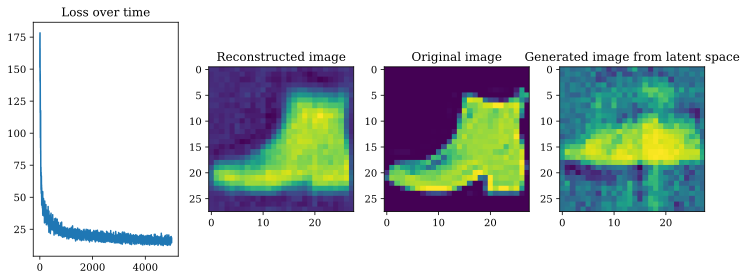

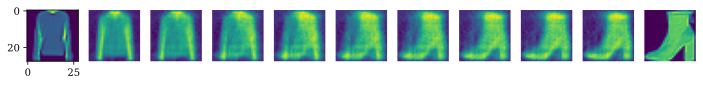

In [3]:
# ===== Load Fashion MNIST dataset =====
def get_datasets(dataset_name):
    """Load MNIST train and test datasets into memory."""
    ds_builder = tfds.builder(dataset_name)
    ds_builder.download_and_prepare()
    train_ds = tfds.as_numpy(ds_builder.as_dataset(split='train', batch_size=-1))
    test_ds = tfds.as_numpy(ds_builder.as_dataset(split='test', batch_size=-1))
    train_ds['image'] = jnp.float32(train_ds['image']) / 255.
    test_ds['image'] = jnp.float32(test_ds['image']) / 255.
    return train_ds, test_ds

train_ds, test_ds = get_datasets("fashion_mnist")
my_train_labels = jax.nn.one_hot(train_ds['label'], num_classes=10)
my_train_images = train_ds['image']

@partial(jit, static_argnums=(3,))
def get_batch(key, my_train_images, my_train_labels, batch_size):
    idx_batch = random.choice(key, jnp.arange(len(my_train_images)), shape=(batch_size,), replace=True)
    batch_images = my_train_images[idx_batch]
    batch_labels = my_train_labels[idx_batch]
    return batch_images, batch_labels

batch_size = 32
key = random.PRNGKey(0)

batch_images, batch_labels = get_batch(key, my_train_images, my_train_labels, batch_size)

# ===== Model Definition =====
class Encoder(nn.Module):
    "Last feature size is the size of the latent space"
    features: Sequence[int]

    @nn.compact
    def __call__(self, x):
        x = x.reshape((x.shape[0], -1))
        for feat in self.features[:-1]:
            x = nn.relu(nn.Dense(feat)(x))
        mean_x = nn.Dense(self.features[-1], name="le_mean")(x)
        logstd_x = nn.Dense(self.features[-1], name="le_logstd")(x)
        return mean_x, logstd_x

class Decoder(nn.Module):
    features: Sequence[int]

    @nn.compact
    def __call__(self, x):
        x = x.reshape((x.shape[0], -1))
        for feat in self.features[:-1]:
            x = nn.relu(nn.Dense(feat)(x))
        return nn.Dense(self.features[-1])(x)

# ===== Sample from z =====
def sample_gaussian(key, mean, logstd):
    "Sample a Gaussian with mean and diagonal covariance matrix"
    return logstd * random.normal(key, shape=mean.shape) + mean

class VAE(nn.Module):
    encoder_widths: Sequence[int]
    decoder_widths: Sequence[int]
    input_shape: Sequence[int]

    def setup(self):
        input_dim = np.prod(self.input_shape)
        self.encoder = Encoder(self.encoder_widths)
        self.decoder = Decoder(self.decoder_widths + (input_dim,))

    def __call__(self, x, z_rng):
        mean, logstd = self.encoder(x)
        z = sample_gaussian(z_rng, mean, logstd)
        x_reconstructed = self.decoder(z)
        return x_reconstructed, mean, logstd

    def decode(self, z):
        return nn.sigmoid(self.decoder(z))

    def encode(self, x):
        assert x.shape[1:] == self.input_shape
        return self.encoder(jnp.reshape(x, (x.shape[0], -1)))

    def generate(self, key, params):
        z_dim = self.encoder_widths[-1]
        z = random.normal(key, shape=(1, z_dim))
        return self.apply(params, z, method=self.decode).reshape((28, 28))

    def interpolate(self, params, image_1, image_2, alpha):
        z1, _ = self.apply(params, image_1[jnp.newaxis, :, :, :], method=self.encode)
        z2, _ = self.apply(params, image_2[jnp.newaxis, :, :, :], method=self.encode)
        z_interp = z1 * (1 - alpha) + alpha * z2
        return self.apply(params, z_interp, method=self.decode).reshape((28, 28))

# ===== ELBO optimiser =====
@vmap
def log_lik(x, x_reconstructed):
    var = 1
    x = x.flatten()
    diff = x - x_reconstructed
    return -(1 / var) * (diff @ diff)

# ===== KL divergence between two Gaussians =====
@vmap
def KL_Divergence(mean, logstd):
    return -0.5 * jnp.sum(1 + 2 * logstd - jnp.square(jnp.exp(logstd)) - jnp.square(mean))

# ===== Negative ELBO =====
def Neg_ELBO(key, params, batch_images):
    x_reconstructed, mean, logstd = model_vae.apply(params, batch_images, key)
    return -log_lik(batch_images, x_reconstructed).mean() + KL_Divergence(mean, logstd).mean()

@jit
def step(key, params, opt_state):
    "Run 1 step of ELBO optimiser"
    subkey1, subkey2 = random.split(key)
    batch_images, _ = get_batch(subkey1, my_train_images, my_train_labels, 32)
    loss, grads = value_and_grad(Neg_ELBO, 1)(subkey2, params, batch_images)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss

z_dim = 20
model_vae = VAE(encoder_widths=[100, 784, z_dim], decoder_widths=[z_dim, 784, 100], input_shape=batch_images.shape[1:])

key, subkey1, subkey2 = random.split(key, 3)
params = model_vae.init(subkey1, batch_images, subkey2)
optimizer = optax.adam(5e-4)
opt_state = optimizer.init(params)

loss_list = []

for i in range(5000):
    key, subkey = random.split(key)
    params, opt_state, loss = step(key, params, opt_state)
    loss_list += [loss]
    if i % 1000 == 0:
        print(f"iter: {i}, train loss: {loss:.5f}")

# ===== Plotting =====
fig, axs = plt.subplots(1, 4, figsize=(10, 4), tight_layout=True)
# Plot loss
axs[0].plot(loss_list)
axs[0].set_title('Loss over time')
# Plot reconstructed image
x_rec, mean, logstd = model_vae.apply(params, batch_images, key)
idx = 29
axs[1].imshow(x_rec.reshape((32, 28, 28, 1))[idx, :, :, 0])
axs[1].set_title('Reconstructed image')
# Plot original image
axs[2].imshow(batch_images[idx, :, :, 0])
axs[2].set_title('Original image')
# Generate new image from latent space
key, subkey = random.split(key)
axs[3].imshow(model_vae.generate(subkey, params))
axs[3].set_title('Generated image from latent space')

# Interpolate between images
img_1 = my_train_images[0]
img_2 = my_train_images[11]
list_alpha = np.arange(0.1, 1, 0.1)
fig, ax = plt.subplots(1, len(list_alpha) + 2, figsize=(12, 4))
ax[0].imshow(img_1.squeeze())
for idx, alpha in enumerate(list_alpha):
    img_interp = model_vae.interpolate(params, img_1, img_2, alpha)
    ax[idx + 1].imshow(img_interp)
    ax[idx + 1].axis('off')
ax[-1].imshow(img_2.squeeze())
ax[-1].axis('off')
plt.show()

# Diffusion Models

Diffusion models are based on the principle that while generating structured data from noise is challenging, degrading structured data into noise is relatively straightforward. These models employ a forward diffusion process to gradually transform observed data $\boldsymbol{x}_0$ into a noisy version $\boldsymbol{x}_T$ over $T$ steps using a stochastic encoder $q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1})$. After sufficient steps, the data becomes indistinguishable from pure noise, typically approximated by a standard normal distribution $\mathcal{N}(\mathbf{0}, \mathbf{I})$. The model then learns a reverse process to reconstruct the original data by passing the noise through $T$ steps of a decoder $p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)$, ultimately generating $\boldsymbol{x}_0$.

**Denoising Diffusion Probabilistic Model**: In this framework, the forward diffusion process adds Gaussian noise to the data at each step without learning any parameters, serving as the inference network. The reverse diffusion process is a learned Gaussian model that removes the noise, functioning as the decoder.

## Denoising Diffusion Probabilistic Models (DDPMs)

DDPMs resemble hierarchical variational autoencoders but with all latent states $\boldsymbol{x}_t$ (for $t = 1, 2, \ldots, T$) sharing the same dimensionality as the input $\boldsymbol{x}_0$. Unlike normalizing flows, diffusion models use stochastic hidden layers and do not require invertible transformations. The encoder $q$ is a predefined linear Gaussian model, and the decoder $p$ is shared across all time steps. These simplifications lead to a straightforward training objective, reducing to weighted nonlinear least squares problems, and facilitate stable training without the risk of posterior collapse.

### Encoder (Forward Diffusion)

The forward diffusion process is defined by:

$$
q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1}) = \mathcal{N}\left( \boldsymbol{x}_t \mid \sqrt{1 - \beta_t} \, \boldsymbol{x}_{t-1}, \beta_t \mathbf{I} \right)
$$

where $\beta_t \in (0, 1)$ are predefined noise parameters forming a noise schedule. The joint distribution over all latent states conditioned on the input is:

$$
q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0) = \prod_{t=1}^T q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1})
$$

Since this is a linear Gaussian Markov chain, we can compute marginals analytically:

$$
q(\boldsymbol{x}_t \mid \boldsymbol{x}_0) = \mathcal{N}\left( \boldsymbol{x}_t \mid \sqrt{\bar{\alpha}_t} \, \boldsymbol{x}_0, (1 - \bar{\alpha}_t) \mathbf{I} \right)
$$

with:

$$
\alpha_t = 1 - \beta_t, \quad \bar{\alpha}_t = \prod_{s=1}^t \alpha_s
$$

By choosing $\bar{\alpha}_T \approx 0$, we ensure that $q(\boldsymbol{x}_T \mid \boldsymbol{x}_0) \approx \mathcal{N}(\mathbf{0}, \mathbf{I})$. The marginal distribution $q(\boldsymbol{x}_t)$ is obtained by integrating over $\boldsymbol{x}_0$:

$$
q(\boldsymbol{x}_t) = \int q_0(\boldsymbol{x}_0) \, q(\boldsymbol{x}_t \mid \boldsymbol{x}_0) \, d\boldsymbol{x}_0
$$

As $t$ increases, $q(\boldsymbol{x}_t)$ approaches a standard normal distribution. In image data, this process progressively removes details, starting with fine textures and eventually blurring out shapes, leading to pure noise.

**Conceptual Illustration**: The forward diffusion process transforms the data distribution $q(\boldsymbol{x}_0)$ into a simple distribution like $\mathcal{N}(\mathbf{0}, \mathbf{I})$. To generate new data, we sample from this simple distribution and apply the reverse diffusion process to reconstruct data samples resembling the original distribution.

### Decoder (Reverse Diffusion)

The reverse diffusion process aims to invert the forward process. Assuming knowledge of $\boldsymbol{x}_0$, we can express the reverse transition:

$$
\begin{aligned}
q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0) &= \mathcal{N}\left( \boldsymbol{x}_{t-1} \mid \tilde{\boldsymbol{\mu}}_t(\boldsymbol{x}_t, \boldsymbol{x}_0), \tilde{\beta}_t \mathbf{I} \right) \\
\tilde{\boldsymbol{\mu}}_t(\boldsymbol{x}_t, \boldsymbol{x}_0) &= \frac{\sqrt{\bar{\alpha}_{t-1}} \beta_t}{1 - \bar{\alpha}_t} \boldsymbol{x}_0 + \frac{\sqrt{\alpha_t} (1 - \bar{\alpha}_{t-1})}{1 - \bar{\alpha}_t} \boldsymbol{x}_t \\
\tilde{\beta}_t &= \frac{1 - \bar{\alpha}_{t-1}}{1 - \bar{\alpha}_t} \beta_t
\end{aligned}
$$

In practice, we do not have access to $\boldsymbol{x}_0$ when generating new data. Therefore, we train a model to approximate this reverse process averaged over the data distribution. The learned reverse process is defined as:

$$
p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t) = \mathcal{N}\left( \boldsymbol{x}_{t-1} \mid \boldsymbol{\mu}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t), \boldsymbol{\Sigma}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right)
$$

Typically, the covariance is set to $\boldsymbol{\Sigma}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) = \sigma_t^2 \mathbf{I}$, with $\sigma_t^2$ chosen as $\beta_t$ or $\tilde{\beta}_t$ to bound the reverse process entropy.

The joint distribution over all variables is:

$$
p_{\boldsymbol{\theta}}(\boldsymbol{x}_{0:T}) = p(\boldsymbol{x}_T) \prod_{t=1}^T p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)
$$

where $p(\boldsymbol{x}_T) = \mathcal{N}(\mathbf{0}, \mathbf{I})$.

### Model Fitting

We train the model by maximizing the Evidence Lower Bound (ELBO), similar to variational autoencoders. For each data point $\boldsymbol{x}_0$, we have:

$$
\begin{aligned}
\log p_{\boldsymbol{\theta}}(\boldsymbol{x}_0) &= \log \int q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0) \frac{p_{\boldsymbol{\theta}}(\boldsymbol{x}_{0:T})}{q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0)} \, d\boldsymbol{x}_{1:T} \\
&\geq \int q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0) \log \left[ p(\boldsymbol{x}_T) \prod_{t=1}^T \frac{p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)}{q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1})} \right] \, d\boldsymbol{x}_{1:T} \\
&= \mathbb{E}_{q} \left[ \log p(\boldsymbol{x}_T) + \sum_{t=1}^T \log \frac{p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)}{q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1})} \right ] = \mathcal{E}(\boldsymbol{x}_0)
\end{aligned}
$$

Using the Markov property and Bayes' rule, we simplify the terms:

$$
q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1}, \boldsymbol{x}_0) = \frac{q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0) \, q(\boldsymbol{x}_t \mid \boldsymbol{x}_0)}{q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_0)}
$$

Substituting back into the ELBO:

$$
\mathcal{E}(\boldsymbol{x}_0) = \mathbb{E}_{q} \left[ \log p(\boldsymbol{x}_T) + \sum_{t=2}^T \log \frac{p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)}{q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0)} + \left( \log q(\boldsymbol{x}_1 \mid \boldsymbol{x}_0) - \log q(\boldsymbol{x}_T \mid \boldsymbol{x}_0) \right) + \log p_{\boldsymbol{\theta}}(\boldsymbol{x}_0 \mid \boldsymbol{x}_1) \right]
$$

The negative ELBO becomes:

$$
\begin{aligned}
\mathcal{L}(\boldsymbol{x}_0) &= -\mathbb{E}_{q} \left[ \log \frac{p(\boldsymbol{x}_T)}{q(\boldsymbol{x}_T \mid \boldsymbol{x}_0)} + \sum_{t=2}^T \log \frac{p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)}{q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0)} + \log p_{\boldsymbol{\theta}}(\boldsymbol{x}_0 \mid \boldsymbol{x}_1) \right] \\
&= D_{\text{KL}} \left( q(\boldsymbol{x}_T \mid \boldsymbol{x}_0) \, \| \, p(\boldsymbol{x}_T) \right) + \sum_{t=2}^T \mathbb{E}_{q} \left[ D_{\text{KL}} \left( q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0) \, \| \, p_{\boldsymbol{\theta}}(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t) \right) \right] - \mathbb{E}_{q} \left[ \log p_{\boldsymbol{\theta}}(\boldsymbol{x}_0 \mid \boldsymbol{x}_1) \right]
\end{aligned}
$$

We denote these terms as $L_T(\boldsymbol{x}_0)$, $L_{t-1}(\boldsymbol{x}_0)$, and $L_0(\boldsymbol{x}_0)$, respectively. Each KL divergence can be computed analytically since the distributions are Gaussian.

Focusing on $L_{t-1}$, we use:

$$
\boldsymbol{x}_t = \sqrt{\bar{\alpha}_t} \, \boldsymbol{x}_0 + \sqrt{1 - \bar{\alpha}_t} \, \boldsymbol{\epsilon}
$$

This allows us to express:

$$
\tilde{\boldsymbol{\mu}}_t(\boldsymbol{x}_t, \boldsymbol{x}_0) = \frac{1}{\sqrt{\alpha_t}} \left( \boldsymbol{x}_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon} \right)
$$

Instead of predicting $\tilde{\boldsymbol{\mu}}_t$, we train the model to predict the noise $\boldsymbol{\epsilon}$. The model's mean becomes:

$$
\boldsymbol{\mu}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) = \frac{1}{\sqrt{\alpha_t}} \left( \boldsymbol{x}_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right)
$$

The loss function averaged over the dataset is:

$$
L_{t-1} = \mathbb{E}_{\boldsymbol{x}_0, \boldsymbol{\epsilon}} \left[ \lambda_t \left\| \boldsymbol{\epsilon} - \boldsymbol{\epsilon}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right\|^2 \right]
$$

where:

$$
\lambda_t = \frac{\beta_t^2}{2 \sigma_t^2 \alpha_t (1 - \bar{\alpha}_t)}, \quad \boldsymbol{x}_t = \sqrt{\bar{\alpha}_t} \, \boldsymbol{x}_0 + \sqrt{1 - \bar{\alpha}_t} \, \boldsymbol{\epsilon}, \quad \boldsymbol{\epsilon} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})
$$

Empirically, setting $\lambda_t = 1$ often yields better results. The simplified loss function is:

$$
L_{\text{simple}} = \mathbb{E}_{\boldsymbol{x}_0, \boldsymbol{\epsilon}, t} \left[ \left\| \boldsymbol{\epsilon} - \boldsymbol{\epsilon}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right\|^2 \right]
$$

with $t$ uniformly sampled from $\{1, 2, \ldots, T\}$.

**Training Procedure**:

1. **Sample Data**: Draw $\boldsymbol{x}_0$ from the data distribution.
2. **Sample Time Step**: Choose $t$ uniformly from $\{1, \ldots, T\}$.
3. **Sample Noise**: Generate $\boldsymbol{\epsilon} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$.
4. **Compute Noisy Input**: Calculate $\boldsymbol{x}_t = \sqrt{\bar{\alpha}_t} \, \boldsymbol{x}_0 + \sqrt{1 - \bar{\alpha}_t} \, \boldsymbol{\epsilon}$.
5. **Compute Loss**: Evaluate the loss $\left\| \boldsymbol{\epsilon} - \boldsymbol{\epsilon}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right\|^2$.
6. **Update Parameters**: Perform a gradient descent step on the loss with respect to $\boldsymbol{\theta}$.

**Sampling Procedure**:

1. **Initialize Noise**: Start with $\boldsymbol{x}_T \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$.
2. **Iterative Denoising**: For $t = T, T - 1, \ldots, 1$:
   - If $t > 1$, sample $\boldsymbol{\epsilon}_t \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$; else set $\boldsymbol{\epsilon}_t = \mathbf{0}$.
   - Compute:

     $$
     \boldsymbol{x}_{t-1} = \frac{1}{\sqrt{\alpha_t}} \left( \boldsymbol{x}_t - \frac{1 - \alpha_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right) + \sigma_t \boldsymbol{\epsilon}_t
     $$

3. **Output Data**: Return $\boldsymbol{x}_0$.

By following this process, the model progressively refines noise into a coherent data sample, effectively generating new data resembling the training distribution.

In [4]:
# Generate Dataset
n_samples = 100_000

# Create a dataset of two interleaving half circles (moons)
x, _ = datasets.make_moons(n_samples=n_samples, noise=.06)

# Standardize the dataset
scaler = preprocessing.StandardScaler()
x = scaler.fit_transform(x)

class MLP(nn.Module):
    """ A simple MLP in Flax. This is the noise-prediction or score function.
    """
    hidden_dim: int = 32
    out_dim: int = 2
    n_layers: int = 2

    @nn.compact
    def __call__(self, x):
        for _ in range(self.n_layers):
            x = nn.Dense(features=self.hidden_dim)(x)
            x = nn.gelu(x)
        x = nn.Dense(features=self.out_dim)(x)
        return x

def beta_t(t, t_min=1e-4, t_max=0.02):
    """ Linear variance schedule
    """
    return t_min + (t_max - t_min) * t

def alpha_t(t, t_min=1e-4, t_max=0.02):
    """ 1 - beta_t
    """
    return 1 - beta_t(t, t_min, t_max)

def alpha_t_bar(t_n, t_N=100, t_min=1e-4, t_max=0.02):
    """ Reparameterized (1 - sigma^2) for q(x_t | x_0)
    """
    alpha_t_ary = jax.vmap(alpha_t, in_axes=(0,None,None))(jnp.arange(t_N) / t_N, t_min, t_max)
    alpha_t_cumprod = jnp.cumprod(alpha_t_ary)
    return alpha_t_cumprod[t_n]

def sigma_q2(t_n, t_N=100, t_min=1e-4, t_max=0.02):
    """ Standard deviation of q(x_{t-1} | x_t)
    """
    return (1 - alpha_t(t_n, t_min, t_max)) / (1 - alpha_t_bar(t_n, t_N, t_min, t_max)) * (1 - alpha_t_bar(t_n - 1, t_N, t_min, t_max))

def weight(t):
    return 1.

@partial(jax.jit, static_argnums=(3,))
def loss_fn(params, x, t_n, score, key):
    eps = jax.random.normal(key, shape=x.shape)
    alpha_t_bar_ary = jax.vmap(alpha_t_bar, in_axes=(0,None,None,None))(t_n, t_N, 1e-4, 0.02)
    x_t = jnp.sqrt(alpha_t_bar_ary) * x + jnp.sqrt(1 - alpha_t_bar_ary) * eps
    eps_pred = score.apply(params, jnp.concatenate([x_t, t_n / t_N], -1))
    return weight(t_n / t_N) * jnp.mean((eps - eps_pred) ** 2)

n_smoke_test = 16

key = jax.random.PRNGKey(0)
t_n = jnp.arange(n_smoke_test)[:, None]
t_N = n_smoke_test

score = MLP(hidden_dim=128, out_dim=2, n_layers=5)
params = score.init(key, jnp.concatenate([x[:n_smoke_test], t_n / t_N], axis=1))

opt = optax.adam(learning_rate=3e-4)
opt_state = opt.init(params)

n_steps = 5_000
n_batch = 128
t_N = 100

with trange(n_steps) as steps:
    for step in steps:
        # Draw a random batch from x
        key, subkey = jax.random.split(key)
        idx = jax.random.choice(key, x.shape[0], shape=(n_batch,))
        x_batch = x[idx]
        t_n_batch = jax.random.choice(key, t_N, shape=(x_batch.shape[0], 1))
        loss, grads = jax.value_and_grad(loss_fn)(params, x_batch, t_n_batch, score, key)
        updates, opt_state = opt.update(grads, opt_state)
        params = optax.apply_updates(params, updates)
        steps.set_postfix(val=loss)

# The pre-factor lambda_ddpm weighs the amount of "stochasticity" in sampling, 
# with lambda_ddpm=0 corresponding to a deterministic sampling from the Gaussian latents and
# lambda_ddpm=1 is the usual DDPM stochastic sampling
def single_sample_fn(score, params, key, t_N=50, lambda_ddpm=1.):
    """ Ancestral sampling with `t_N` timesteps.
        `lambda_ddpm = 1` corresponds to the DDPM, `lambda_ddpm = 0` corresponds to the DDIM.
    """
    x_t = jax.random.normal(key, (2,))
    for t_i in range(t_N, 0, -1):
        t = (t_i / t_N)
        t = jnp.atleast_1d(t)
        key, _ = jax.random.split(key)
        eps = jax.random.normal(key, shape=x_t.shape)
        eps_pred = score.apply(params, jnp.concatenate([x_t, t], axis=-1))
        sigma_t = jnp.sqrt((1 - alpha_t_bar(t_i - 1, t_N)) / (1 - alpha_t_bar(t_i, t_N)) * beta_t((t)))
        x_t = 1 / (jnp.sqrt(alpha_t(t))) * (x_t - (1 - alpha_t(t)) / (jnp.sqrt(1 - alpha_t_bar(t_i, t_N))) * eps_pred) + lambda_ddpm * sigma_t * eps
    return x_t

key = jax.random.PRNGKey(42)
single_sample_fn(score, params, key, t_N=50, lambda_ddpm=1.)

sample_fn = partial(single_sample_fn, score, params, t_N=50)

n_samples = 100
sample_key = jax.random.split(key, n_samples ** 2)
x_sample = jax.vmap(sample_fn)(sample_key)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].hist2d(x[:, 0], x[:, 1], bins=100)
axs[0].set_xlim(-2, 2)
axs[0].set_ylim(-2, 2)
axs[0].set_title("Data Distribution")
axs[1].hist2d(x_sample[:, 0], x_sample[:, 1], bins=100)
axs[1].set_xlim(-2, 2)
axs[1].set_ylim(-2, 2)
axs[1].set_title("Generated Samples")
plt.show()

100%|██████████| 5000/5000 [00:38<00:00, 130.71it/s, val=0.5174722510804265] 


# Continuous-Time Models Using Differential Equations

In diffusion models, we can consider the limit where the number of diffusion steps $T$ approaches infinity. This transition from discrete to continuous time introduces more complex mathematics but offers significant advantages. By framing the diffusion process in terms of differential equations, we can leverage advanced numerical solvers for ordinary and stochastic differential equations, leading to faster and more efficient sample generation.

## Forward Diffusion Stochastic Differential Equation (SDE)

Let's begin by examining the forward diffusion process in the continuous-time limit. We rewrite the discrete noise level $\beta_t$ as $\beta(t) \Delta t$, where $\Delta t$ is an infinitesimal time step:

$$
\boldsymbol{x}_t = \sqrt{1 - \beta(t) \Delta t} \, \boldsymbol{x}_{t-1} + \sqrt{\beta(t) \Delta t} \, \mathcal{N}(\mathbf{0}, \mathbf{I})
$$

For small $\Delta t$, we can approximate $\sqrt{1 - \beta(t) \Delta t} \approx 1 - \frac{1}{2} \beta(t) \Delta t$. Substituting this approximation, we get:

$$
\boldsymbol{x}_t \approx \boldsymbol{x}_{t-1} - \frac{1}{2} \beta(t) \Delta t \, \boldsymbol{x}_{t-1} + \sqrt{\beta(t) \Delta t} \, \mathcal{N}(\mathbf{0}, \mathbf{I})
$$

Dividing both sides by $\Delta t$ and taking the limit as $\Delta t \to 0$, we obtain the continuous-time stochastic differential equation:

$$
\frac{d\boldsymbol{x}(t)}{dt} = -\frac{1}{2} \beta(t) \boldsymbol{x}(t) + \sqrt{\beta(t)} \, \frac{d\boldsymbol{w}(t)}{dt}
$$

Here, $\boldsymbol{w}(t)$ represents a standard Wiener process, also known as Brownian motion. In general, such SDEs can be written in the form:

$$
d\boldsymbol{x} = \underbrace{\boldsymbol{f}(\boldsymbol{x}, t)}_{\text{drift}} \, dt + \underbrace{g(t)}_{\text{diffusion}} \, d\boldsymbol{w}
$$

- **Drift Term** ($\boldsymbol{f}(\boldsymbol{x}, t)$): Determines the deterministic part of the motion.
- **Diffusion Term** ($g(t)$): Introduces randomness into the system.

**Intuition**: Imagine observing particles undergoing Brownian motion. The drift term pulls the particles towards a certain direction (e.g., towards zero), while the diffusion term causes them to spread out randomly.

By simulating sample paths starting from the data distribution at time $t = 0$, we can observe how the distribution evolves over time due to the diffusion process. Initially, the data retains its structure, but as time progresses, the distribution becomes increasingly noisy, eventually approaching a standard normal distribution at time $t = 1$.

## Forward Diffusion Ordinary Differential Equation (ODE)

Alternatively, we can consider a deterministic evolution of the data using an ordinary differential equation known as the **probability flow ODE**:

$$
d\boldsymbol{x} = \left[ \boldsymbol{f}(\boldsymbol{x}, t) - \frac{1}{2} g(t)^2 \nabla_{\boldsymbol{x}} \log p_t(\boldsymbol{x}) \right] dt
$$

- $\nabla_{\boldsymbol{x}} \log p_t(\boldsymbol{x})$ is the **score function**, representing the gradient of the log probability density at time $t$.

This ODE describes how the data distribution evolves deterministically over time without the addition of noise. We can solve this equation using standard ODE solvers to obtain the state of the system at any time $t$:

$$
\boldsymbol{x}(t) = \boldsymbol{x}(0) + \int_0^t \left[ \boldsymbol{f}(\boldsymbol{x}(\tau), \tau) - \frac{1}{2} g(\tau)^2 \nabla_{\boldsymbol{x}} \log p_{\tau}(\boldsymbol{x}(\tau)) \right] d\tau
$$

## Reverse Diffusion SDE

To generate new samples, we need to reverse the diffusion process. The reverse-time SDE is given by:

$$
d\boldsymbol{x} = \left[ \boldsymbol{f}(\boldsymbol{x}, t) - g(t)^2 \nabla_{\boldsymbol{x}} \log q_t(\boldsymbol{x}) \right] dt + g(t) \, d\overline{\boldsymbol{w}}
$$

- $\overline{\boldsymbol{w}}$ is the Wiener process in reverse time.
- $\nabla_{\boldsymbol{x}} \log q_t(\boldsymbol{x})$ is the score function of the reverse process.

For the DDPM case, the reverse SDE simplifies to:

$$
d\boldsymbol{x}_t = \left[ -\frac{1}{2} \beta(t) \boldsymbol{x}_t - \beta(t) \nabla_{\boldsymbol{x}_t} \log q_t(\boldsymbol{x}_t) \right] dt + \sqrt{\beta(t)} \, d\overline{\boldsymbol{w}}_t
$$

This equation describes how to reconstruct the data from noise by following the reverse stochastic dynamics.

## Reverse Diffusion ODE

Alternatively, we can derive an ODE for the reverse process, eliminating the stochastic term:

$$
d\boldsymbol{x}_t = \left[ \boldsymbol{f}(\boldsymbol{x}, t) - \frac{1}{2} g(t)^2 \boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right] dt
$$

- $\boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t)$ is a neural network approximation of the score function $\nabla_{\boldsymbol{x}_t} \log q_t(\boldsymbol{x}_t)$.

For DDPMs, this becomes:

$$
d\boldsymbol{x}_t = -\frac{1}{2} \beta(t) \left[ \boldsymbol{x}_t + \boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right] dt
$$

This deterministic ODE can be solved using numerical methods like Euler's method or more advanced ODE solvers for improved accuracy:

$$
\boldsymbol{x}_{t - \Delta t} = \boldsymbol{x}_t + \frac{1}{2} \beta(t) \left[ \boldsymbol{x}_t + \boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right] \Delta t
$$

## Comparing SDE and ODE Approaches

The reverse diffusion process can be implemented either as an SDE or as an ODE:

- **SDE Approach**:
  - Includes a stochastic term, which can help correct errors during integration.
  - Often results in higher-quality samples due to the added randomness.
  - Computationally more intensive due to noise sampling at each step.

- **ODE Approach**:
  - Deterministic, potentially faster since it avoids sampling noise.
  - Requires careful numerical integration to maintain sample quality.
  - Guarantees a unique mapping between data and latent space, aiding in tasks like interpolation.

The connection between these methods becomes evident when we rewrite the reverse SDE:

$$
d\boldsymbol{x}_t = \underbrace{ -\frac{1}{2} \beta(t) \left[ \boldsymbol{x}_t + \boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) \right] dt }_{\text{Probability Flow ODE}} + \underbrace{ -\frac{1}{2} \beta(t) \boldsymbol{s}_{\boldsymbol{\theta}}(\boldsymbol{x}_t, t) dt + \sqrt{\beta(t)} \, d\overline{\boldsymbol{w}}_t }_{\text{Langevin Diffusion SDE}}
$$

This expression shows that the ODE is essentially the drift part of the SDE without the diffusion term.

## Advantages and Disadvantages of Diffusion Models

### Advantages

- **Tractability and Flexibility**: Diffusion models offer a balance between being analytically tractable and flexible enough to model complex data distributions. They can be trained efficiently and allow for precise likelihood computations.

- **Stable Training**: The training process avoids the instability issues often encountered in models like GANs, leading to more reliable convergence.

- **High-Quality Samples**: Capable of generating high-fidelity samples that capture intricate data patterns.

### Disadvantages

- **Computational Intensity**: Generating samples requires simulating the diffusion process over many time steps, making it computationally expensive and slower compared to other models like GANs.

- **Complex Implementation**: Implementing and tuning diffusion models can be more complex due to the involvement of differential equations and numerical solvers.

- **Sampling Speed**: Despite recent advancements to accelerate sampling, diffusion models generally have slower generation times, which can be a limitation for real-time applications.

100%|██████████| 10000/10000 [01:15<00:00, 132.68it/s, val=7.192133575383583]


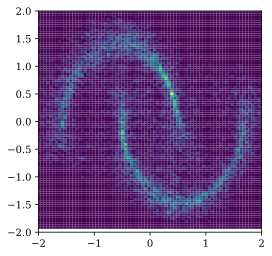

In [5]:
# Generate Dataset
n_samples = 100_000

# Create a dataset of two interleaving half circles (moons)
x, _ = datasets.make_moons(n_samples=n_samples, noise=.06)

# Standardize the dataset
scaler = preprocessing.StandardScaler()
x = scaler.fit_transform(x)

class MLP(nn.Module):
    """ A simple MLP in Flax. This is the noise-prediction or score function.
    """
    hidden_dim: int = 32
    out_dim: int = 2
    n_layers: int = 2

    @nn.compact
    def __call__(self, x):
        for _ in range(self.n_layers):
            x = nn.Dense(features=self.hidden_dim)(x)
            x = nn.gelu(x)
        x = nn.Dense(features=self.out_dim)(x)
        return x

def int_beta(t):
    return t

def alpha(t):
    """ Mean of perturbation kernel q(x_t | x_0)
    """
    return jnp.exp(-0.5 * int_beta(t))

def sigma(t):
    """ Standard deviation of perturbation kernel q(x_t | x_0)
    """
    return jnp.sqrt(1 - jnp.exp(-int_beta(t)))

@partial(jax.jit, static_argnums=(3, 4,))
def loss_fn(params, x, t, int_beta, score, key):
    eps = jax.random.normal(key, shape=x.shape)
    x_t = alpha(t) * x + sigma(t) * eps
    pred = score.apply(params, jnp.concatenate([x_t, t], -1))
    return jnp.mean((pred + eps / sigma(t)) ** 2)

key = jax.random.PRNGKey(0)
t = jnp.ones((x.shape[0], 1))

score = MLP(hidden_dim=128, out_dim=2, n_layers=5)
params = score.init(key, jnp.concatenate([x, t], axis=1))

opt = optax.adam(learning_rate=3e-4)
opt_state = opt.init(params)

n_steps = 10_000
n_batch = 128
T = 1.

with trange(n_steps) as steps:
    for step in steps:
        # Draw a random batch from x
        key, subkey = jax.random.split(key)
        idx = jax.random.choice(key, x.shape[0], shape=(n_batch,))
        x_batch = x[idx]
        t_batch = jax.random.uniform(key, shape=(x_batch.shape[0], 1), minval=0., maxval=T)
        loss, grads = jax.value_and_grad(loss_fn)(params, x_batch, t_batch, int_beta, score, key)
        updates, opt_state = opt.update(grads, opt_state)
        params = optax.apply_updates(params, updates)
        steps.set_postfix(val=loss)

def single_sample_fn(model, params, data_shape, dt0, t1, key):
    def drift(t, y, args):
        t = jnp.atleast_1d(t)
        _, beta = jax.jvp(int_beta, (t,), (jnp.ones_like(t),))
        return -0.5 * beta * (y + model.apply(params, jnp.concatenate([y, t], -1)))

    term = dfx.ODETerm(drift)
    solver = dfx.Euler()
    t0 = 0
    y1 = jax.random.normal(key, data_shape)
    sol = dfx.diffeqsolve(term, solver, t1, t0, -dt0, y1)
    return sol.ys[0]

dt = 0.01
single_sample_fn(score, params, (2,), dt, T, key)

sample_fn = partial(single_sample_fn, score, params, (2,), dt, T)

n_samples = 100
sample_key = jax.random.split(key, n_samples ** 2)
x_sample = jax.vmap(sample_fn)(sample_key)

plt.figure(figsize=(4, 4))
plt.hist2d(x_sample[:, 0], x_sample[:, 1], bins=100)
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()

100%|██████████| 10000/10000 [01:19<00:00, 126.56it/s, val=4.794423232890775]


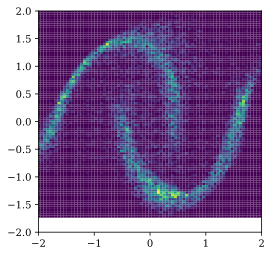

In [6]:
# Generate Dataset
n_samples = 100_000

# Create a dataset of two interleaving half circles (moons)
x, _ = datasets.make_moons(n_samples=n_samples, noise=.06)

# Standardize the dataset
scaler = preprocessing.StandardScaler()
x = scaler.fit_transform(x)

class MLP(nn.Module):
    """ A simple MLP in Flax. This is the noise-prediction or score function.
    """
    hidden_dim: int = 32
    out_dim: int = 2
    n_layers: int = 2

    @nn.compact
    def __call__(self, x):
        for _ in range(self.n_layers):
            x = nn.Dense(features=self.hidden_dim)(x)
            x = nn.gelu(x)
        x = nn.Dense(features=self.out_dim)(x)
        return x

def int_beta(t):
    return t

def alpha(t):
    """ Mean of perturbation kernel q(x_t | x_0)
    """
    return jnp.exp(-0.5 * int_beta(t))

def sigma(t):
    """ Standard deviation of perturbation kernel q(x_t | x_0)
    """
    return jnp.sqrt(1 - jnp.exp(-int_beta(t)))

@partial(jax.jit, static_argnums=(3, 4,))
def loss_fn(params, x, t, int_beta, score, key):
    eps = jax.random.normal(key, shape=x.shape)
    x_t = alpha(t) * x + sigma(t) * eps
    pred = score.apply(params, jnp.concatenate([x_t, t], -1))
    return jnp.mean((pred + eps / sigma(t)) ** 2)

key = jax.random.PRNGKey(0)
t = jnp.ones((x.shape[0], 1))

score = MLP(hidden_dim=128, out_dim=2, n_layers=5)
params = score.init(key, jnp.concatenate([x, t], axis=1))

opt = optax.adam(learning_rate=3e-4)
opt_state = opt.init(params)

n_steps = 10_000
n_batch = 128
T = 1.

with trange(n_steps) as steps:
    for step in steps:
        # Draw a random batch from x
        key, subkey = jax.random.split(key)
        idx = jax.random.choice(key, x.shape[0], shape=(n_batch,))
        x_batch = x[idx]
        t_batch = jax.random.uniform(key, shape=(x_batch.shape[0], 1), minval=0., maxval=T)
        loss, grads = jax.value_and_grad(loss_fn)(params, x_batch, t_batch, int_beta, score, key)
        updates, opt_state = opt.update(grads, opt_state)
        params = optax.apply_updates(params, updates)
        steps.set_postfix(val=loss)

# Sampling via solving the reverse-time SDE
def single_sample_fn(model, params, data_shape, dt0, t1, key):
    def drift(t, y, args):
        t = jnp.atleast_1d(t)
        _, beta = jax.jvp(int_beta, (t,), (jnp.ones_like(t),))
        return -0.5 * beta * y - beta * model.apply(params, jnp.concatenate([y, t], -1))
    
    def diffusion(t, y, args):
        t = jnp.atleast_1d(t)
        _, beta = jax.jvp(int_beta, (t,), (jnp.ones_like(t),))
        return jnp.sqrt(beta)

    t0 = 0
    bm = dfx.VirtualBrownianTree(t0, t1, tol=1e-5, shape=(1,), key=key)
    key, _ = jax.random.split(key)
    terms = dfx.MultiTerm(dfx.ODETerm(drift), dfx.ControlTerm(diffusion, bm))
    solver = dfx.Heun()
    y1 = jax.random.normal(key, data_shape)
    sol = dfx.diffeqsolve(terms, solver, t1, t0, -dt0, y1)
    return sol.ys[0]

dt = 0.05

single_sample_fn(score, params, (2,), dt, T, key)

sample_fn = partial(single_sample_fn, score, params, (2,), dt, T)

n_samples = 100
sample_key = jax.random.split(key, n_samples ** 2)
x_sample = jax.vmap(sample_fn)(sample_key)

plt.figure(figsize=(4, 4))
plt.hist2d(x_sample[:, 0], x_sample[:, 1], bins=100)
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()

# Energy-Based Models (EBMs)

Energy-Based Models provide a flexible framework for modeling probability distributions over data by associating an energy value with each data point. The core idea is to define a scalar energy function $\mathcal{E}_{\boldsymbol{\theta}}(\mathbf{x})$, parameterized by $\boldsymbol{\theta}$, and use it to compute a probability density via the Boltzmann distribution:

$$
p_{\boldsymbol{\theta}}(\mathbf{x}) = \frac{\exp\left( -\mathcal{E}_{\boldsymbol{\theta}}(\mathbf{x}) \right)}{Z_{\boldsymbol{\theta}}}
$$

- $\mathcal{E}_{\boldsymbol{\theta}}(\mathbf{x})$: Energy function mapping data $\mathbf{x}$ to a scalar energy value.
- $Z_{\boldsymbol{\theta}}$: Partition function ensuring the distribution sums (or integrates) to one:

  $$
  Z_{\boldsymbol{\theta}} = \int \exp\left( -\mathcal{E}_{\boldsymbol{\theta}}(\mathbf{x}) \right) d\mathbf{x}
  $$

**Interpretation**: Data points with lower energy values are assigned higher probabilities, and vice versa. The energy function can be any real-valued function, offering great flexibility in model design.

## Challenges with EBMs

- **Intractable Partition Function**: Computing $Z_{\boldsymbol{\theta}}$ involves integrating over the entire data space, which is typically intractable for high-dimensional data. This makes exact likelihood computation and normalization difficult.

- **Training Difficulties**:
  - **Gradient Computation**: Training requires computing gradients of the log-likelihood, which involve expectations over the model distribution and thus depend on the intractable partition function.
  - **Approximate Methods**: Techniques like Contrastive Divergence or Score Matching are employed to approximate gradients, but they introduce additional complexity and potential biases.

- **Sampling**: Generating samples from $p_{\boldsymbol{\theta}}(\mathbf{x})$ often requires Markov Chain Monte Carlo (MCMC) methods, which can be slow and may not mix well in high-dimensional spaces.

## Advantages of EBMs

- **Architectural Flexibility**: The energy function $\mathcal{E}_{\boldsymbol{\theta}}(\mathbf{x})$ can be parameterized by any neural network architecture, including those that are not invertible or normalized. This allows for the use of powerful models like ResNets or Transformers.

- **Implicit Density Modeling**: EBMs focus on modeling the relative energies between data points rather than explicit probability densities, which can be advantageous in certain applications.

- **Unsupervised Feature Learning**: By learning to assign low energy to observed data and higher energy to other regions, EBMs can capture underlying data structures and representations useful for downstream tasks.

## Training Strategies

Due to the challenges with the partition function, several strategies are used to train EBMs:

- **Contrastive Divergence (CD)**: Approximates the gradient of the log-likelihood by running short MCMC chains starting from the data. Commonly used in training Restricted Boltzmann Machines (RBMs).

- **Score Matching**: Directly minimizes the difference between the data score function and the model score function without computing the partition function.

- **Noise-Contrastive Estimation (NCE)**: Transforms density estimation into a classification problem between data and noise samples, sidestepping the need to compute $Z_{\boldsymbol{\theta}}$.

## Applications

- **Image Generation**: EBMs can generate realistic images, though sampling can be slow.

- **Denoising and Inpainting**: By defining energies that capture the plausibility of data configurations, EBMs can be used for tasks like image denoising.

- **Representation Learning**: EBMs can learn useful features for classification or other tasks through unsupervised learning.